In [1]:
import anndata as ad
import scanpy as sc
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import warnings
import pandas as pd
from joblib import Parallel, delayed
import numpy as np

In [2]:
##sample names are: m5,p5_1,p5_2,m4,p5

In [3]:
#set result directory
sc.settings.figdir = "/blue/square.t/peter.huynh/jupyter/p4/combined_samples_scvelo/data"
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [4]:
# set once in the main process
warnings.filterwarnings(
    "ignore",
    category=FutureWarning,
    message=r".*na_action.*Categorical\.map.*",
)
warnings.filterwarnings(
    "ignore",
    category=UserWarning,
    message=r"No data for colormapping provided via 'c'.*cmap.*",)
warnings.simplefilter("ignore", FutureWarning)
warnings.simplefilter("ignore", UserWarning)

In [5]:
gray_green = LinearSegmentedColormap.from_list(
    "gray_green", ["#D3D3D3", "#02500e", "#001203"]
)
gray_orange = LinearSegmentedColormap.from_list(
    "gray_orange", ["#D3D3D3", "#f76d48", "#FA4616"]
)

In [6]:
adata_combined = ad.read_h5ad("/blue/square.t/peter.huynh/jupyter/combined_samples_scvelo/p4/data/processed/p4_adata_clustered_(30,38)_(0.5,1.0)_8_6_25.h5ad")

In [8]:
keep = [0, 2, 3, 4, 6, 7, 8, 9, 10, 11, 12, 14]
adata_subset = adata_combined[adata_combined.obs["leiden"].isin(map(str, keep))].copy()

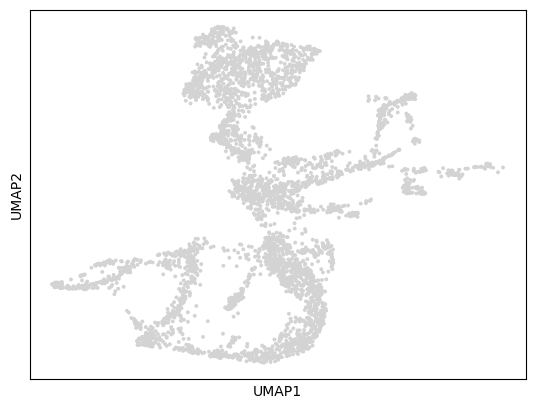

In [9]:
sc.pl.umap(adata_subset)

In [10]:
adata_raw = adata_subset.copy() 
adata_transformed = adata_subset.copy() 

In [12]:
seed=13
adata_subset_test = adata_transformed.copy()
sc.tl.pca(adata_subset_test, n_comps=50,svd_solver='arpack',random_state=seed)


▶ Batch 1/29 | Combos 1–6


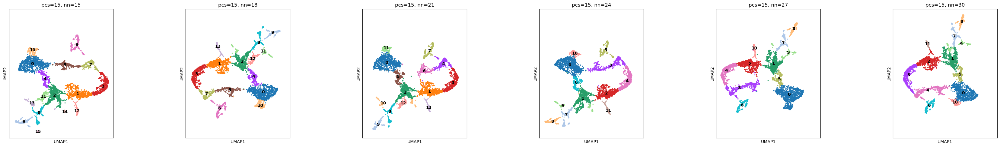


▶ Batch 2/29 | Combos 7–12


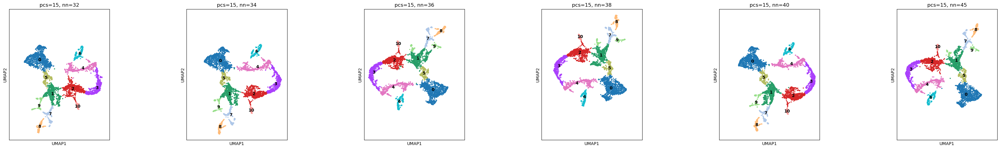


▶ Batch 3/29 | Combos 13–18


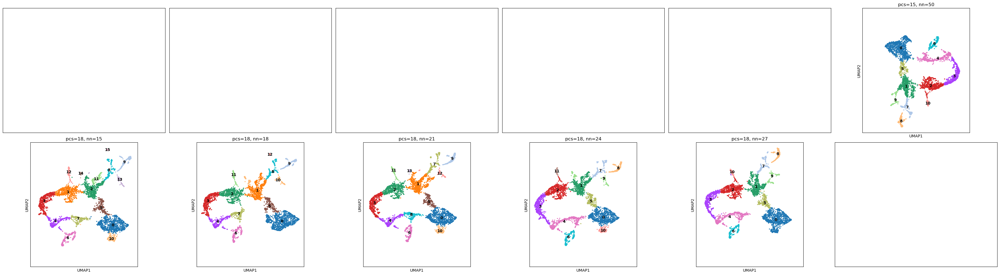


▶ Batch 4/29 | Combos 19–24


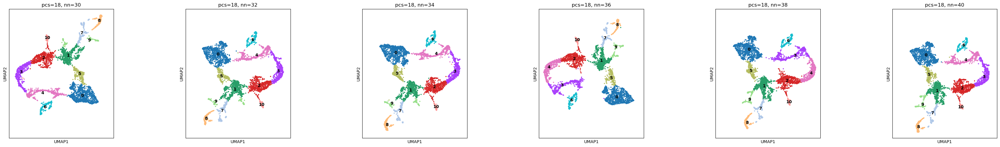


▶ Batch 5/29 | Combos 25–30


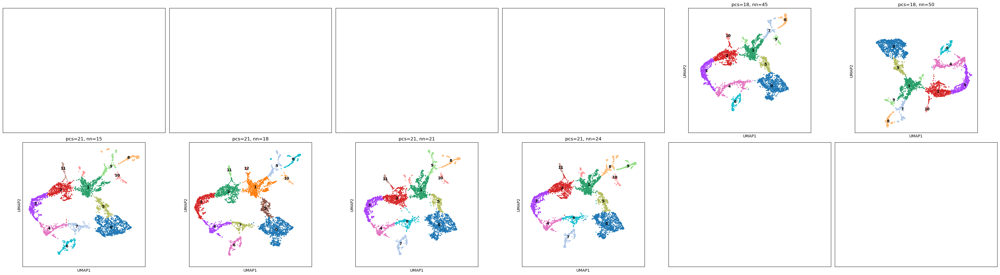


▶ Batch 6/29 | Combos 31–36


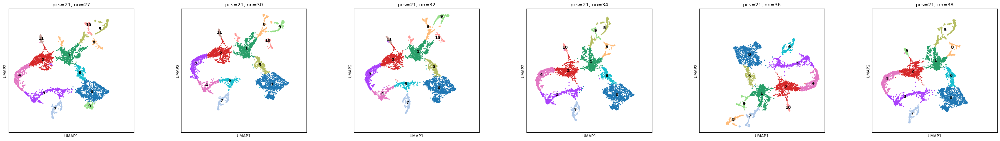


▶ Batch 7/29 | Combos 37–42


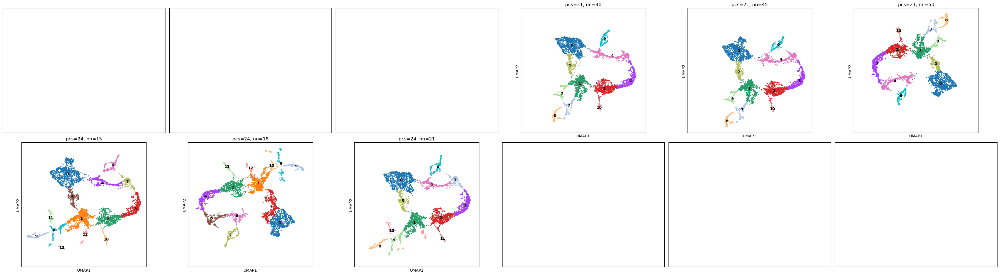


▶ Batch 8/29 | Combos 43–48


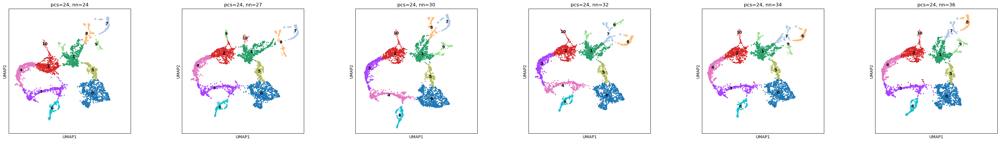


▶ Batch 9/29 | Combos 49–54


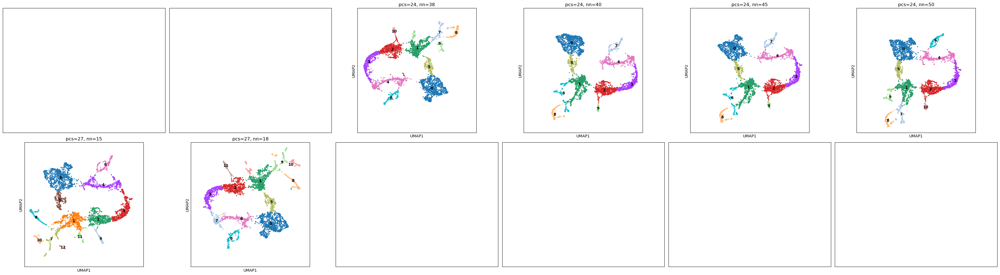


▶ Batch 10/29 | Combos 55–60


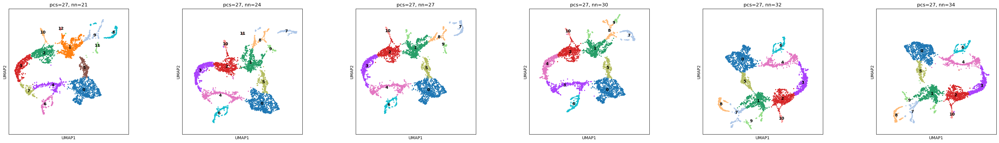


▶ Batch 11/29 | Combos 61–66


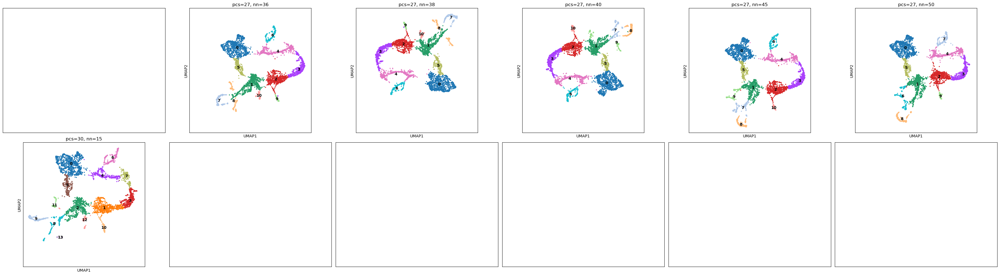


▶ Batch 12/29 | Combos 67–72


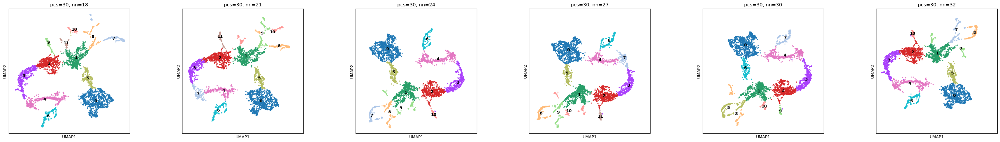


▶ Batch 13/29 | Combos 73–78


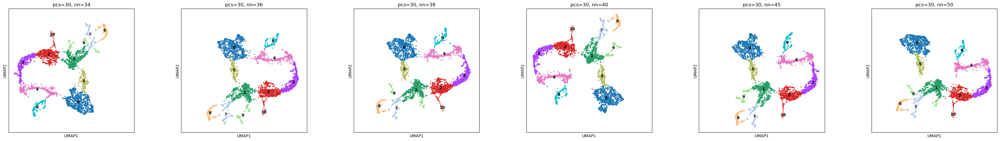


▶ Batch 14/29 | Combos 79–84


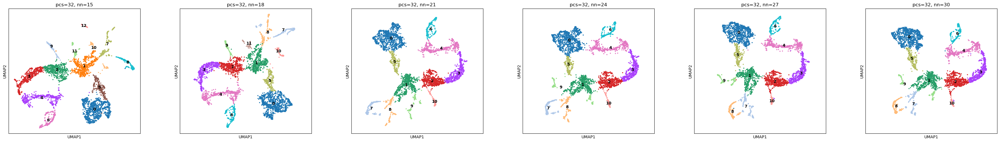


▶ Batch 15/29 | Combos 85–90


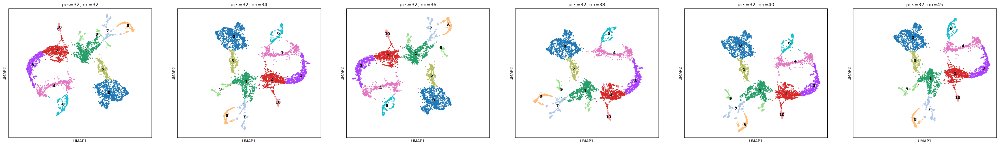


▶ Batch 16/29 | Combos 91–96


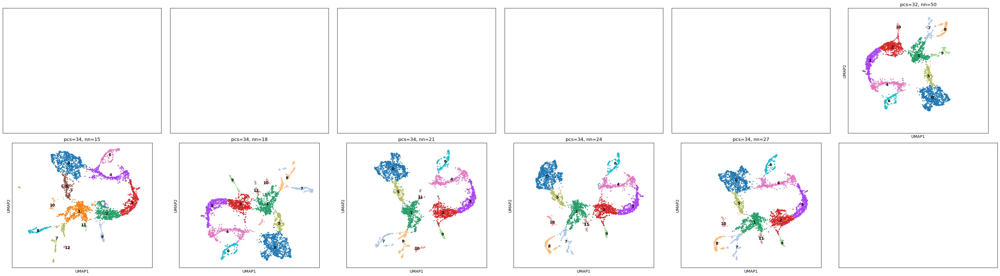


▶ Batch 17/29 | Combos 97–102


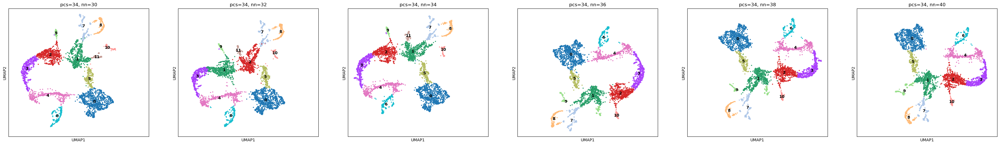


▶ Batch 18/29 | Combos 103–108


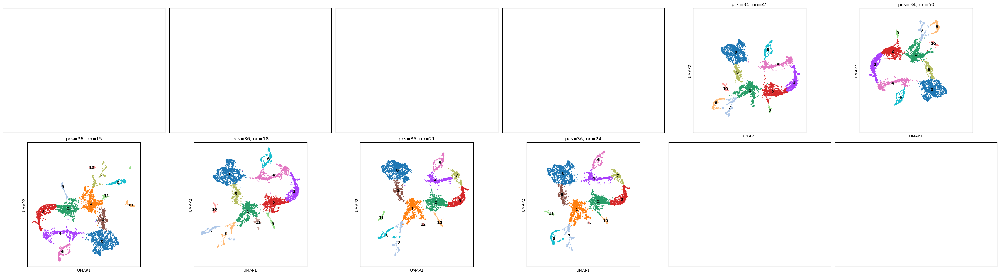


▶ Batch 19/29 | Combos 109–114


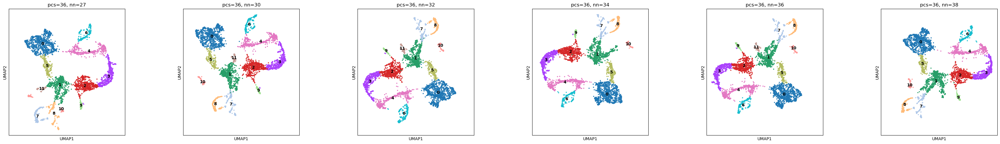


▶ Batch 20/29 | Combos 115–120


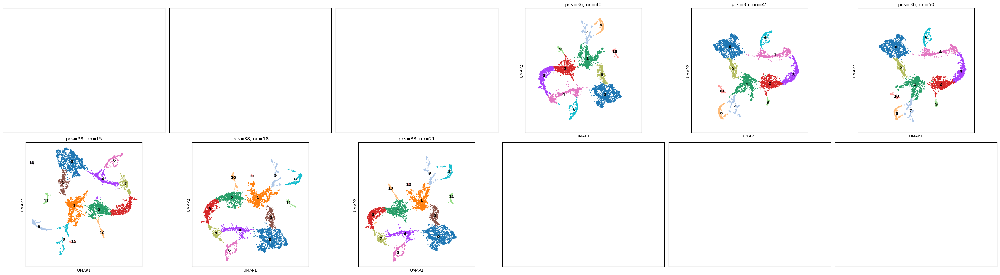


▶ Batch 21/29 | Combos 121–126


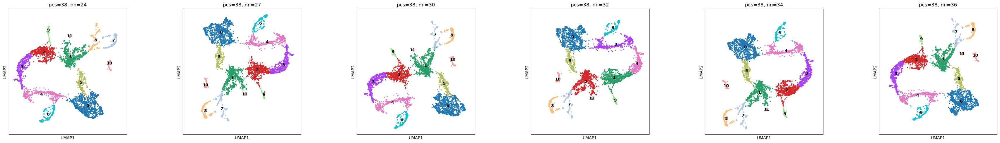


▶ Batch 22/29 | Combos 127–132


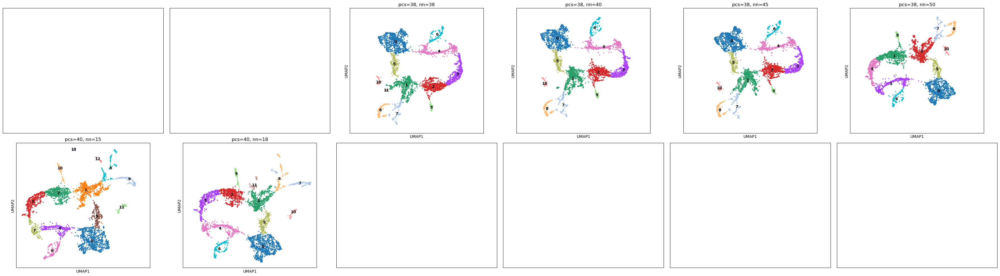


▶ Batch 23/29 | Combos 133–138


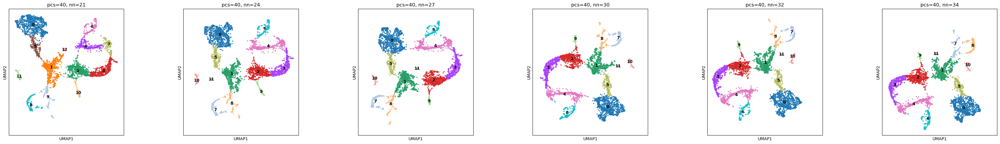


▶ Batch 24/29 | Combos 139–144


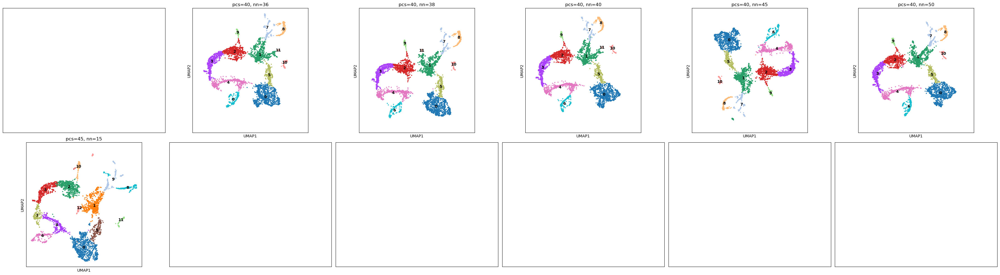


▶ Batch 25/29 | Combos 145–150


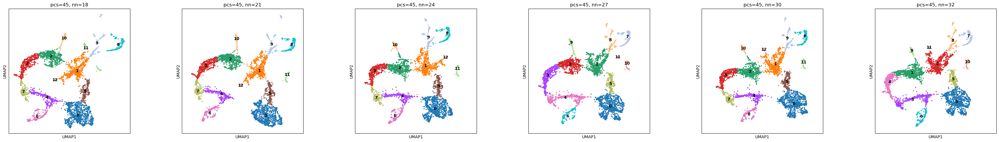


▶ Batch 26/29 | Combos 151–156


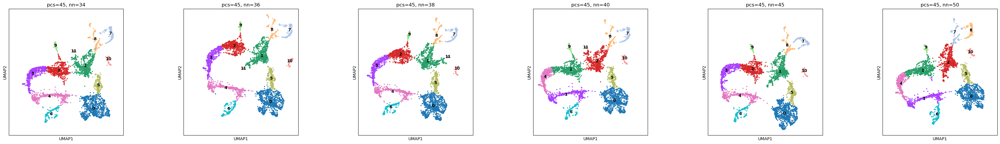


▶ Batch 27/29 | Combos 157–162


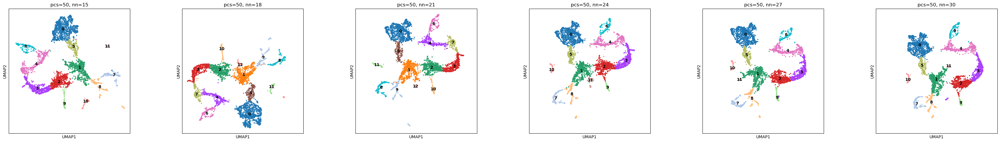


▶ Batch 28/29 | Combos 163–168


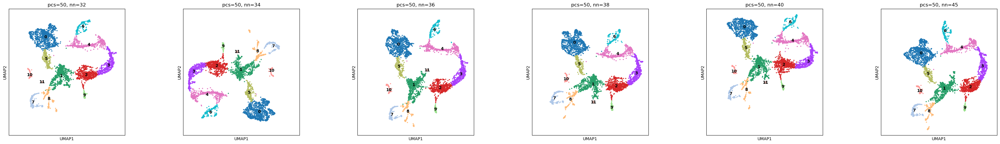


▶ Batch 29/29 | Combos 169–169


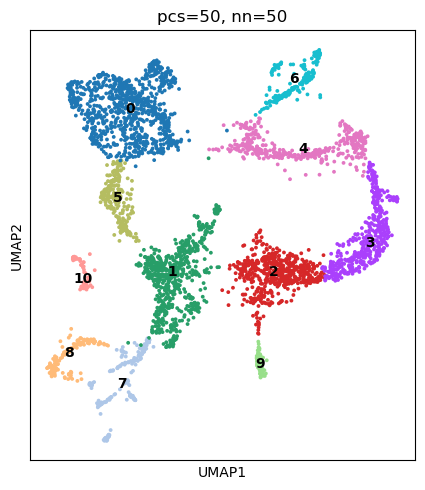

In [23]:
# --- USER PARAMETERS ---
n_pcs_list = [15, 18, 21, 24, 27, 30, 32, 34, 36, 38, 40, 45, 50]
n_neighbors_list = [15, 18, 21, 24, 27, 30, 32, 34, 36, 38, 40, 45, 50]
n_jobs = 6                
batch_size = n_jobs
seed=13

adata_raw = adata_combined.copy() 
adata_transformed = adata_combined.copy() 

resolution = 0.3
point_size = max(10, 60-5* max(1,n_jobs))

# --- INPUT DATA ---
#adata_subset_test = adata_transformed.copy()
#sc.pp.normalize_total(adata_subset_test, target_sum=1e4) 
#sc.pp.log1p(adata_subset_test)
#sc.tl.pca(adata_subset_test, n_comps=50,svd_solver='arpack',random_state=seed)

adata_temp = adata_subset_test.copy()


# --- GRID ---
param_grid = [(pcs, nn) for pcs in n_pcs_list for nn in n_neighbors_list]
n_total = len(param_grid)
n_batches = int(np.ceil(n_total / batch_size))

# --- UMAP Function ---
def compute_umap_npc_nn(n_pcs, n_neighbors):
    adata_temp = adata_subset_test.copy()
    sc.pp.neighbors(adata_temp, n_neighbors=n_neighbors, n_pcs=n_pcs,random_state=seed)
    sc.tl.umap(adata_temp,random_state=seed,min_dist=.4,spread=1)
    sc.tl.leiden(adata_temp, resolution=resolution,random_state=seed)
    return adata_temp, n_pcs, n_neighbors

# --- RUN BATCHES ---
for batch_i in range(n_batches):
    start = batch_i * batch_size
    end = min((batch_i + 1) * batch_size, n_total)
    batch = param_grid[start:end]

    print(f"\n▶ Batch {batch_i+1}/{n_batches} | Combos {start+1}–{end}")
    #print(adata_temp.obs["leiden"].value_counts(dropna=False))

    results = Parallel(n_jobs=n_jobs)(
        delayed(compute_umap_npc_nn)(pcs, nn) for pcs, nn in batch
    )

    # Grid dimensions
    unique_pcs = sorted(set(pcs for pcs, _ in batch))
    unique_nn = sorted(set(nn for _, nn in batch))
    n_rows = len(unique_pcs)
    n_cols = len(unique_nn)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 6, n_rows * 5), sharex=True, sharey=True)

    # If only one row or col, axes is not 2D
    if n_rows == 1 and n_cols == 1:
        axes = np.array([[axes]])
    elif n_rows == 1:
        axes = axes[np.newaxis, :]
    elif n_cols == 1:
        axes = axes[:, np.newaxis]

    for i, (adata_temp, n_pcs, n_neighbors) in enumerate(results):
        row = unique_pcs.index(n_pcs)
        col = unique_nn.index(n_neighbors)
        ax = axes[row, col]

        sc.pl.umap(
            adata_temp,
            color="leiden",
            title=f"pcs={n_pcs}, nn={n_neighbors}",
            ax=ax,
            show=False,
            legend_loc="on data",
            size=point_size,
            cmap="viridis"
        )
        ax.set_aspect("equal")

    plt.tight_layout()
    plt.show()

In [ ]:
# Set UMAP parameter grid
min_dist_list = [0.0005, 0.001, 0.002, 0.005,0.01, 0.025, 0.05,.06,0.07, 0.08, 0.1,.12,0.15, 0.18, 0.2, 0.25, 0.3,
    0.35, 0.4,.45,0.5,.55 ,0.6,.65, 0.7, 0.8,.85, 0.9, 1.0]

spread_list = [
    0.8, 0.9, 1.0, 1.1, 1.2, 1.3, 1.4,
    1.5, 1.6, 1.7, 1.8, 1.9, 2.0,
    2.1, 2.2, 2.3, 2.5
]
n_jobs = 6
batch_size = n_jobs
n_pcs = 40
n_neighbors = 50
resolution = 0.3
point_size = max(10, 60 - 5 * max(len(min_dist_list), len(spread_list)))
seed=13
# --- INPUT DATA ---
#adata_transformed = adata_combined.copy() 
#adata_subset_test = adata_transformed.copy()
#sc.pp.normalize_total(adata_subset_test, target_sum=1e4) 
#sc.pp.log1p(adata_subset_test)
#sc.tl.pca(adata_subset_test, n_comps=50,svd_solver='arpack',random_state=seed)


# --- GRID ---
param_grid = [(md, sp) for md in min_dist_list for sp in spread_list]
n_total = len(param_grid)
n_batches = int(np.ceil(n_total / batch_size))

# --- UMAP Function ---
def compute_umap_data(min_dist, spread):
    adata_temp = adata_subset_test.copy()
    sc.pp.neighbors(adata_temp, n_pcs=n_pcs, n_neighbors=n_neighbors,random_state=seed)
    sc.tl.umap(adata_temp, min_dist=min_dist, spread=spread,random_state=seed)
    sc.tl.leiden(adata_temp, resolution=resolution,random_state=seed)
    return adata_temp, min_dist, spread

# --- RUN BATCHES ---
for batch_i in range(n_batches):
    start = batch_i * batch_size
    end = min((batch_i + 1) * batch_size, n_total)
    batch = param_grid[start:end]

    print(f"\n▶ Batch {batch_i+1}/{n_batches} | Combos {start+1}–{end}")
    #print(adata_temp.obs["leiden"].value_counts(dropna=False))
    
    results = Parallel(n_jobs=n_jobs)(
        delayed(compute_umap_data)(md, sp) for md, sp in batch
    )

    # Unique values in this batch (not always full list)
    unique_md = sorted(set(md for md, _ in batch))
    unique_sp = sorted(set(sp for _, sp in batch))
    n_rows = len(unique_md)
    n_cols = len(unique_sp)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 6, n_rows * 5), sharex=True, sharey=True)

    # Handle 1D axis edge cases
    if n_rows == 1 and n_cols == 1:
        axes = np.array([[axes]])
    elif n_rows == 1:
        axes = axes[np.newaxis, :]
    elif n_cols == 1:
        axes = axes[:, np.newaxis]

    for i, (adata_temp, min_dist, spread) in enumerate(results):
        row = unique_md.index(min_dist)
        col = unique_sp.index(spread)
        ax = axes[row, col]

        sc.pl.umap(
            adata_temp,
            color="leiden",
            title=f"({n_pcs},{n_neighbors})_min_dist={min_dist}, spread={spread}",
            ax=ax,
            show=False,
            legend_loc="on data",
            size=point_size,
            #cmap="viridis"
        )
        ax.set_aspect("equal")

    plt.tight_layout()
    plt.show()

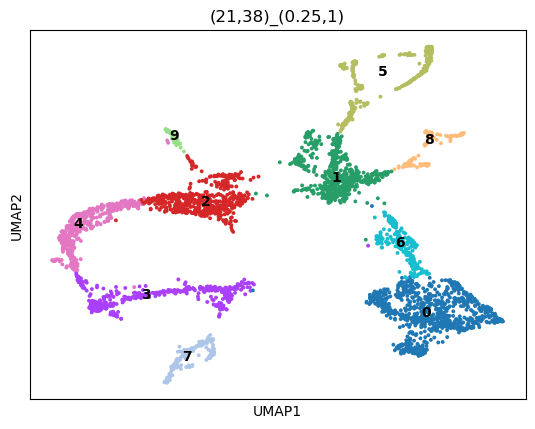

In [25]:
#decided clustering combination
n_pcs=21
n_neighbors=38
min_dist=0.25
spread=1
seed=13
adata_transformed = adata_subset_test.copy() 
sc.pp.neighbors(adata_transformed, n_pcs=n_pcs, n_neighbors=n_neighbors,random_state=seed)
sc.tl.umap(adata_transformed,min_dist=min_dist, spread=spread,random_state=seed)
sc.tl.leiden(adata_transformed,resolution=0.3,random_state=seed)
sc.pl.umap(adata_transformed,color="leiden",cmap="viridis",legend_loc="on data", 
        title=f"({n_pcs},{n_neighbors})_({min_dist},{spread})"
         #save=f"_combined_umap_({n_pcs},{n_neighbors})_({min_dist},{spread}).pdf"
          )

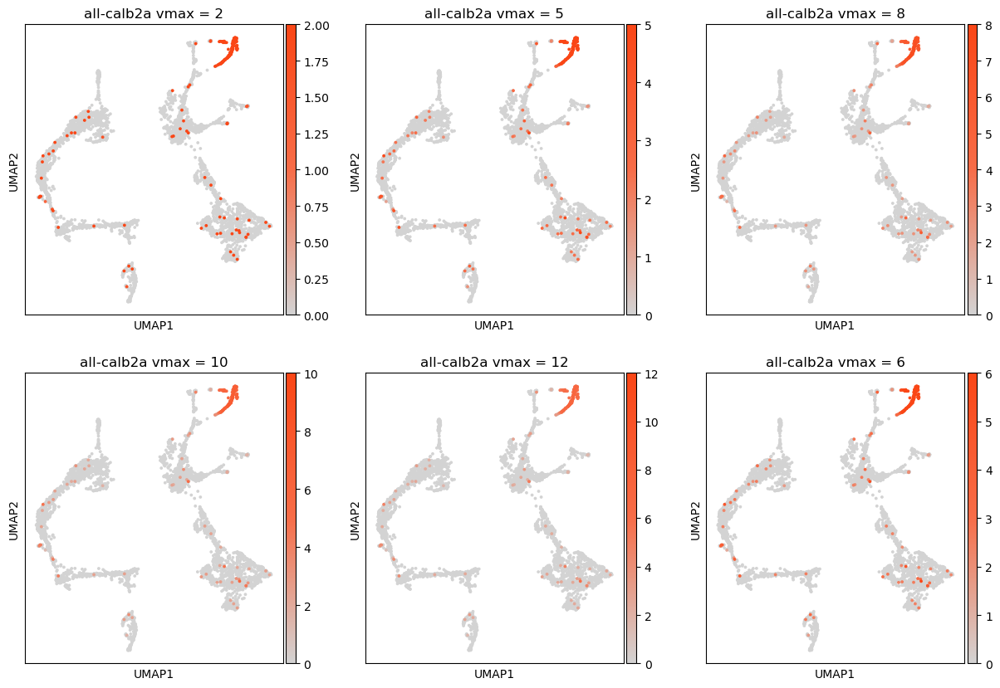

In [22]:
#vmax_values = [12,15,18,20,22,25]
vmax_values = [2,5,8,10,12,6]
gene="calb2a"

ncols = 3
nrows = (len(vmax_values) + ncols - 1) // ncols

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(5 * ncols, 5 * nrows))

axes = axes.flatten()

for i, vmax in enumerate(vmax_values):
    ax = axes[i]
    sc.pl.umap(
        adata_transformed,
        color=gene,
        vmin=0,
        vmax=vmax,
        size=30,
        title=f"all-{gene} vmax = {vmax}",
        cmap=gray_orange,
        show=False,
        ax=ax  
    )

In [26]:
adata_transformed.write(f"/blue/square.t/peter.huynh/jupyter/combined_samples_scvelo/p4/data/processed/p4_subseted_adata_clustered_({n_pcs},{n_neighbors})_({min_dist},{spread})_8_3_25.h5ad")

In [ ]:
D035	PQH	11/5/2024	D008	D001	outcross	maternal:NFkB reporter;paternal:oCh:Dr_eda ixixix
D040	PQH	11/19/2024	D001	D008	outcross	maternal:Dr_eda ixixix;paternal:oCh:NFkB reporter
D047	PQH	1/8/2025	D008	D001	outcross	maternal:NFkB reporter ; paternal:oCh:Dr_eda ixixix